In [1]:
import sys
sys.path.append('CLIP-dissect') 


In [2]:
import os
import torch
import torchvision
import torch.nn as nn
import numpy as np
import cv2
import glob
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import random_split
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import matplotlib
import similarity
import utils
import data_utils
%matplotlib inline

c:\Users\kier0\anaconda3\envs\facemodel\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from neuron_accuracy import get_actual_labels, neuron_accuracy, count_predicted_emotions
from clip_dissect_pipeline import dissect_pipeline

In [4]:
dataset_path = "FER2013"
class_names = os.listdir(dataset_path+"/train")
print(class_names)

['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


In [5]:
emotions = []
for file_name in glob.glob(dataset_path+'/train/*/*'):
    emotion = file_name.split('/')[-2]
    if emotion not in emotions:
        img = cv2.imread(file_name)
    emotions.append(emotion)
    
emotions = []
for file_name in glob.glob(dataset_path+'/test/*/*'):
    emotion = file_name.split('/')[-2]
    if emotion not in emotions:
        img = cv2.imread(file_name)
    emotions.append(emotion)

In [6]:
transform = transforms.Compose([transforms.ToTensor(),transforms.Resize((48,48))])

train_dataset = ImageFolder(dataset_path+'/train',transform)
train_loader = DataLoader(dataset=train_dataset,batch_size=100*6)
#creating val data loaders
val_dataset = ImageFolder(dataset_path+'/test',transform)
val_loader = DataLoader(dataset=val_dataset,batch_size=100)

In [7]:
d_probe = 'FER2013'
concept_set = 'CLIP-dissect/data/emotions.txt' # concept set needs to be path to .txt file
similarity_fn = similarity.soft_wpmi

In [8]:
train_dataset[0][0].shape

torch.Size([3, 48, 48])

100%|██████████| 7/7 [00:00<00:00, 2332.58it/s]


torch.Size([7, 7])


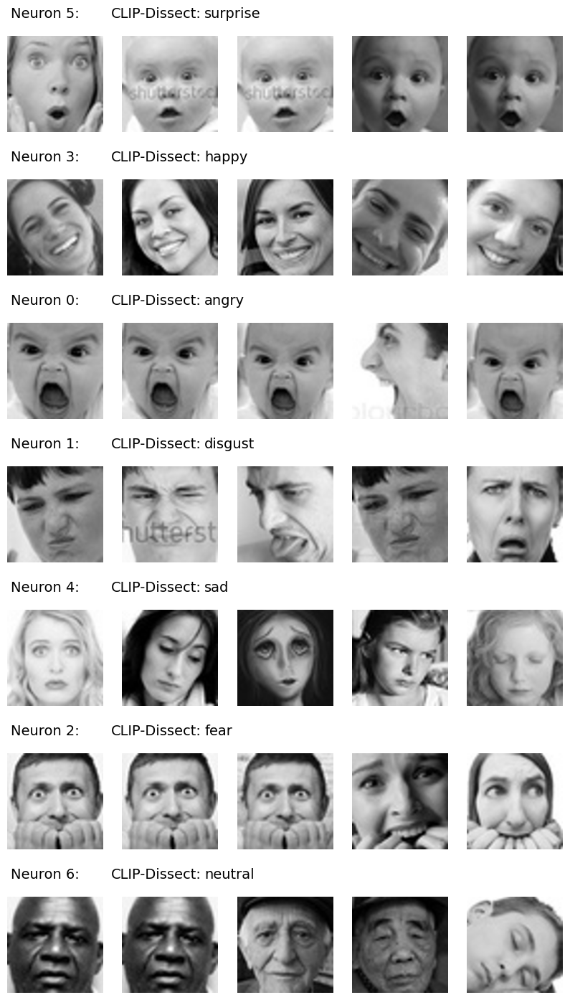

(['surprise', 'happy', 'angry', 'disgust', 'sad', 'fear', 'neutral'],
 {tensor(5, device='cuda:0'): [26468, 27625, 28541, 26094, 28404],
  tensor(3, device='cuda:0'): [13448, 12824, 9265, 14738, 12857],
  tensor(0, device='cuda:0'): [1726, 2323, 1225, 3421, 590],
  tensor(1, device='cuda:0'): [4213, 4128, 4240, 4179, 4193],
  tensor(4, device='cuda:0'): [21913, 24169, 22652, 24108, 24179],
  tensor(2, device='cuda:0'): [5602, 4682, 6878, 8426, 6739],
  tensor(6, device='cuda:0'): [18778, 18345, 19811, 19044, 17904]})

In [22]:
dissect_pipeline(d_probe,concept_set, similarity_fn, 'deep_emotion', 'lin3')

In [9]:
concept_set = 'CLIP-dissect/data/concept_set.txt' # concept set needs to be path to .txt file

100%|██████████| 4096/4096 [00:00<00:00, 6942.42it/s]


torch.Size([4096, 27])


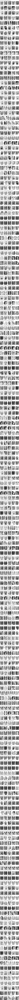

In [10]:
predicted_emotions, neuron_image_indices = dissect_pipeline(d_probe, concept_set, similarity_fn, 'deep_emotion', 'lin2')

In [11]:
pil_data = data_utils.get_data(d_probe)

In [12]:
neuron_accuracy(neuron_image_indices, predicted_emotions, pil_data, concept_set = "concept_set")

Neuron 1692: Predicted Emotion = sad, Accuracy = 1.0
    Image Index 22525: Actual Label = sad
    Image Index 22176: Actual Label = sad
    Image Index 22548: Actual Label = sad
    Image Index 21241: Actual Label = sad
    Image Index 23362: Actual Label = sad
Neuron 2296: Predicted Emotion = sad, Accuracy = 1.0
    Image Index 23721: Actual Label = sad
    Image Index 20928: Actual Label = sad
    Image Index 22224: Actual Label = sad
    Image Index 23890: Actual Label = sad
    Image Index 24638: Actual Label = sad
Neuron 418: Predicted Emotion = angry, Accuracy = 0.0
    Image Index 22351: Actual Label = sad
    Image Index 22995: Actual Label = sad
    Image Index 23025: Actual Label = sad
    Image Index 22224: Actual Label = sad
    Image Index 22298: Actual Label = sad
Neuron 996: Predicted Emotion = surprise, Accuracy = 0.0
    Image Index 8349: Actual Label = fear
    Image Index 8198: Actual Label = fear
    Image Index 7774: Actual Label = fear
    Image Index 4590: Actua

In [30]:
def neuron_correct_full_emotion_count(neuron_image_indices, predicted_emotions, pil_data, concept_set):
    correct_full_emotion_counts = {}

    for neuron, full_predicted_emotion in zip(neuron_image_indices.keys(), predicted_emotions):
        neuron_id = neuron.item()
        image_indices = neuron_image_indices[neuron]
        actual_labels = get_actual_labels(image_indices, pil_data)

        # Decide which part of the predicted emotion to check against actual labels
        if concept_set == "emotion":
            emotion_to_check = full_predicted_emotion
        elif concept_set == "concept_set":
            emotion_to_check = full_predicted_emotion.split()[-1].replace(",", "")

        # Count the number of correct predictions
        correct_count = actual_labels.count(emotion_to_check)

        # Update the count for the full predicted emotion
        if correct_count > 0:  # If there are correct predictions
            if full_predicted_emotion not in correct_full_emotion_counts:
                correct_full_emotion_counts[full_predicted_emotion] = correct_count
            else:
                correct_full_emotion_counts[full_predicted_emotion] += correct_count

    # Print the correct full predicted emotions distribution
    print("Correct Full Predicted Emotions Distribution:")
    for emotion, count in correct_full_emotion_counts.items():
        print(f"    {emotion}: {count}")

    return correct_full_emotion_counts

neuron_correct_full_emotion_count(neuron_image_indices, predicted_emotions, pil_data, concept_set = "concept_set")

Correct Full Predicted Emotions Distribution:
    Tearful Eyes sad: 38
    Tense Mouth and Jaw angry: 55
    Narrowed Eyes angry: 6
    Furrowed Brows angry: 41
    Elevated Cheekbones happy: 4
    Tightened Facial Muscles angry: 2
    Twinkling or Crinkled Eyes happy: 25
    Smiling Mouth and Jaw happy: 57
    Wide Open Eyes surprise: 87
    Slight Chin Raise neutral: 69
    Eyes with a Neutral Gaze neutral: 22
    Neutral or Upright Posture neutral: 3
    Flared Nostrils angry: 15
    Downturned Mouth sad: 18
    Relaxed Mouth and Jaw neutral: 5
    Open Eyes surprise: 1


{'Tearful Eyes sad': 38,
 'Tense Mouth and Jaw angry': 55,
 'Narrowed Eyes angry': 6,
 'Furrowed Brows angry': 41,
 'Elevated Cheekbones happy': 4,
 'Tightened Facial Muscles angry': 2,
 'Twinkling or Crinkled Eyes happy': 25,
 'Smiling Mouth and Jaw happy': 57,
 'Wide Open Eyes surprise': 87,
 'Slight Chin Raise neutral': 69,
 'Eyes with a Neutral Gaze neutral': 22,
 'Neutral or Upright Posture neutral': 3,
 'Flared Nostrils angry': 15,
 'Downturned Mouth sad': 18,
 'Relaxed Mouth and Jaw neutral': 5,
 'Open Eyes surprise': 1}

In [24]:
def count_predicted_emotions(predicted_emotions):
    # Initialize a dictionary to count each type of predicted emotion
    emotion_count = {}

    # Count the occurrences of each predicted emotion
    for predicted_emotion in predicted_emotions:
        emotion = predicted_emotion
        if emotion not in emotion_count:
            emotion_count[emotion] = 1
        else:
            emotion_count[emotion] += 1

    # Print the predicted emotions count
    print("Predicted Emotions Distribution:")
    for emotion, count in emotion_count.items():
        print(f"    {emotion}: {count}")

    return emotion_count


count_predicted_emotions(predicted_emotions)



Predicted Emotions Distribution:
    Tearful Eyes sad: 9
    Tightened Facial Muscles angry: 17
    Open Mouth surprise: 15
    Elevated Cheekbones happy: 13
    Tense Mouth and Jaw angry: 12
    Narrowed Eyes angry: 15
    Furrowed Brows angry: 15
    Neutral or Upright Posture neutral: 2
    Relaxed Facial Muscles neutral: 10
    Twinkling or Crinkled Eyes happy: 5
    Smiling Mouth and Jaw happy: 12
    Wide Open Eyes surprise: 18
    Flared Nostrils angry: 13
    Slight Chin Raise neutral: 14
    Open Eyes surprise: 4
    Compressed Lips angry: 5
    Eyes with a Neutral Gaze neutral: 7
    Downturned Mouth sad: 6
    Mouth in Neutral Position neutral: 2
    Relaxed Mouth and Jaw neutral: 3
    Brows with Unremarkable Tension neutral: 2
    Raised Brows surprise: 1


{'Tearful Eyes sad': 9,
 'Tightened Facial Muscles angry': 17,
 'Open Mouth surprise': 15,
 'Elevated Cheekbones happy': 13,
 'Tense Mouth and Jaw angry': 12,
 'Narrowed Eyes angry': 15,
 'Furrowed Brows angry': 15,
 'Neutral or Upright Posture neutral': 2,
 'Relaxed Facial Muscles neutral': 10,
 'Twinkling or Crinkled Eyes happy': 5,
 'Smiling Mouth and Jaw happy': 12,
 'Wide Open Eyes surprise': 18,
 'Flared Nostrils angry': 13,
 'Slight Chin Raise neutral': 14,
 'Open Eyes surprise': 4,
 'Compressed Lips angry': 5,
 'Eyes with a Neutral Gaze neutral': 7,
 'Downturned Mouth sad': 6,
 'Mouth in Neutral Position neutral': 2,
 'Relaxed Mouth and Jaw neutral': 3,
 'Brows with Unremarkable Tension neutral': 2,
 'Raised Brows surprise': 1}

In [28]:
expression_counts = {
    'Tearful Eyes': 38,
    'Tightened Facial Muscles': 17,
    'Open Mouth': 15,
    'Elevated Cheekbones': 13,
    'Tense Mouth and Jaw': 12,
    'Narrowed Eyes': 15,
    'Furrowed Brows': 15,
    'Neutral or Upright Posture': 2,
    'Relaxed Facial Muscles': 10,
    'Twinkling or Crinkled Eyes': 5,
    'Smiling Mouth and Jaw': 12,
    'Wide Open Eyes': 18,
    'Flared Nostrils': 13,
    'Slight Chin Raise': 14,
    'Open Eyes': 4,
    'Compressed Lips': 5,
    'Eyes with a Neutral Gaze': 7,
    'Downturned Mouth': 6,
    'Mouth in Neutral Position': 2,
    'Relaxed Mouth and Jaw': 3,
    'Brows with Unremarkable Tension': 2,
    'Raised Brows': 1
}

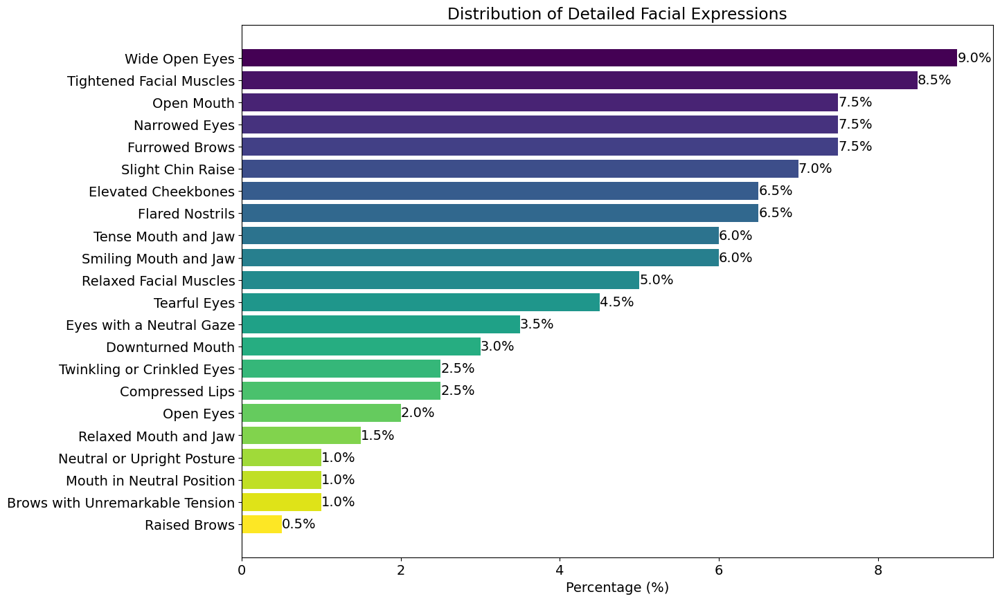

In [27]:
# Recreate the sorted expressions and their percentages for the horizontal bar chart
sorted_expression_details = sorted(expression_counts.items(), key=lambda x: x[1], reverse=True)
expressions = [item[0] for item in sorted_expression_details]
counts = [item[1] for item in sorted_expression_details]
total = sum(counts)
percentages = [(count / total) * 100 for count in counts]
colors = plt.cm.viridis(np.linspace(0, 1, len(expressions)))  # Color map

# Create horizontal bar chart with percentages instead of counts
plt.figure(figsize=[14, 10])
bars = plt.barh(expressions, percentages, color=colors)
plt.xlabel('Percentage (%)')
plt.title('Distribution of Detailed Facial Expressions')

# Add text labels to the bars
for bar, percentage in zip(bars, percentages):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{percentage:.1f}%', va='center', ha='left')

plt.gca().invert_yaxis()  # Invert y-axis to have the highest values on top
plt.show()

In [31]:
original_dict = {
    'Tearful Eyes sad': 38,
    'Tense Mouth and Jaw angry': 55,
    'Narrowed Eyes angry': 6,
    'Furrowed Brows angry': 41,
    'Elevated Cheekbones happy': 4,
    'Tightened Facial Muscles angry': 2,
    'Twinkling or Crinkled Eyes happy': 25,
    'Smiling Mouth and Jaw happy': 57,
    'Wide Open Eyes surprise': 87,
    'Slight Chin Raise neutral': 69,
    'Eyes with a Neutral Gaze neutral': 22,
    'Neutral or Upright Posture neutral': 3,
    'Flared Nostrils angry': 15,
    'Downturned Mouth sad': 18,
    'Relaxed Mouth and Jaw neutral': 5,
    'Open Eyes surprise': 1
}

# Create a new dictionary without the last word in each key
new_dict = {key.rsplit(' ', 1)[0]: value for key, value in original_dict.items()}

new_dict

{'Tearful Eyes': 38,
 'Tense Mouth and Jaw': 55,
 'Narrowed Eyes': 6,
 'Furrowed Brows': 41,
 'Elevated Cheekbones': 4,
 'Tightened Facial Muscles': 2,
 'Twinkling or Crinkled Eyes': 25,
 'Smiling Mouth and Jaw': 57,
 'Wide Open Eyes': 87,
 'Slight Chin Raise': 69,
 'Eyes with a Neutral Gaze': 22,
 'Neutral or Upright Posture': 3,
 'Flared Nostrils': 15,
 'Downturned Mouth': 18,
 'Relaxed Mouth and Jaw': 5,
 'Open Eyes': 1}

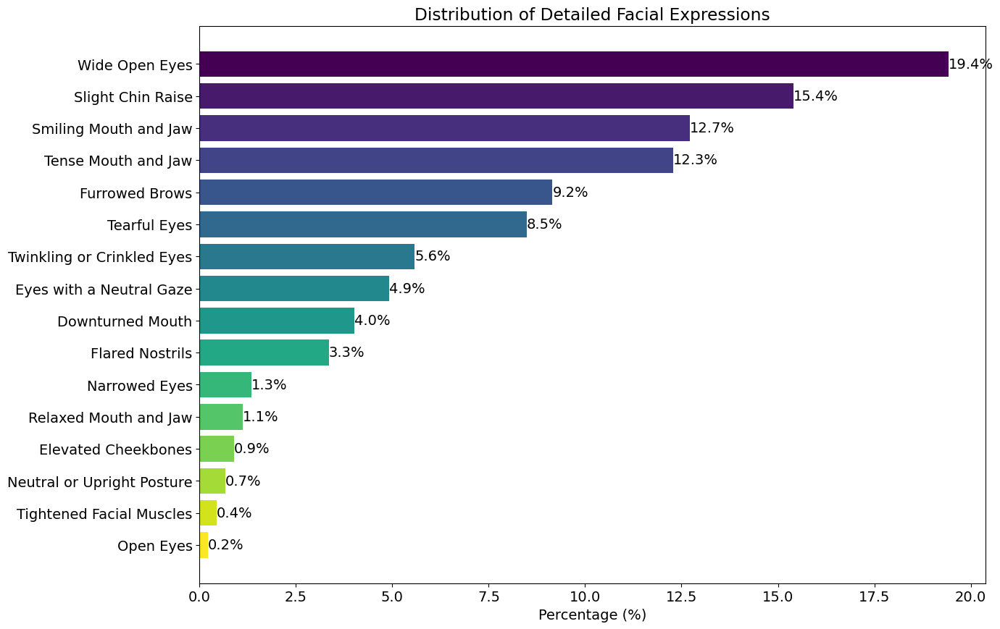

In [32]:
# Recreate the sorted expressions and their percentages for the horizontal bar chart
sorted_expression_details = sorted(new_dict.items(), key=lambda x: x[1], reverse=True)
expressions = [item[0] for item in sorted_expression_details]
counts = [item[1] for item in sorted_expression_details]
total = sum(counts)
percentages = [(count / total) * 100 for count in counts]
colors = plt.cm.viridis(np.linspace(0, 1, len(expressions)))  # Color map

# Create horizontal bar chart with percentages instead of counts
plt.figure(figsize=[14, 10])
bars = plt.barh(expressions, percentages, color=colors)
plt.xlabel('Percentage (%)')
plt.title('Distribution of Detailed Facial Expressions')

# Add text labels to the bars
for bar, percentage in zip(bars, percentages):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{percentage:.1f}%', va='center', ha='left')

plt.gca().invert_yaxis()  # Invert y-axis to have the highest values on top
plt.show()